In [1]:
from sys import path
path.append('../src/')

import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.layers import GlobalAvgPool2D
from keras.models import load_model, Model
from scipy.spatial.distance import cdist
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from global_config import FILE_DUMP_IMAGES, FILE_DUMP_MRKS
from mrk_file import MRKFile
from utils import plot

%matplotlib inline

Using TensorFlow backend.


In [2]:
FILE_BASE_MODEL = '../models/autoencoders_unsupervised/model_2020_03_15-10_43_27.h5'

In [3]:
def plot_pca(embeddings_2d, y):
    plt.figure(figsize=(6, 6))
    plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=1, c=y, cmap='bwr')
    plt.show()

def get_reference_image(x, y):
    images_nc = x[y == 0]

    random_idx = np.random.choice(range(images_nc.shape[0]), size=1)
    img_ref = images_nc[random_idx]

    plt.figure(figsize=(6, 6))
    plt.imshow(img_ref.squeeze()[:, :, ::-1].astype(np.uint8))
    plt.axis('off')
    plt.show()
    
    return img_ref 

def plot_closest_images(img_ref, encoder, x, y, embeddings, n_imgs=20, n_cols=5, figsize=(16, 20)):
    emb_ref = encoder.predict(img_ref / 255)

    distances = cdist(emb_ref, embeddings).squeeze()
    closest_idxs = np.argsort(distances)[1:n_imgs+1] # from 1 because the img in 0 is the reference image itself
    closest_imgs = x[closest_idxs][:, :, :, ::-1]
    closest_pred = y[closest_idxs]

    print(distances[closest_idxs])
    plot.image_batch(closest_imgs, closest_pred, n_cols=n_cols, figsize=figsize)

# Load Data

In [4]:
x, _ = pkl.load(open(FILE_DUMP_IMAGES, 'rb'))
mrks, _ = pkl.load(open(FILE_DUMP_MRKS, 'rb'))

print(x.shape, x.dtype)
print(mrks.shape, mrks.dtype)

(5763, 224, 224, 3) float32
(5763,) object


# Load Model

In [5]:
model = load_model(FILE_BASE_MODEL)

embeddings = GlobalAvgPool2D(name='embeddings')(model.get_layer(name='encoded').output)

encoder = Model(inputs=model.inputs, outputs=embeddings)
encoder.summary()

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 224, 224, 3)       0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 224, 224, 16)      448       
_________________________________________________________________
bn_1 (BatchNormalization)    (None, 224, 224, 16)      64        
_________________________________________________________________
relu_1 (Activation)          (None, 224, 224, 16)      0         
_________________________________________________________________
pool_1 (MaxPooling2D)        (None, 112, 112, 16)      0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 112, 112, 32)      4640      
_____

# Autoencoder as a Recommendation/Recognition System 

In [6]:
embeddings = encoder.predict(x / 255)
print(embeddings.shape)

(5763, 256)


In [7]:
pca = PCA(n_components=2)
emb_2d = pca.fit_transform(embeddings)

print(emb_2d.shape)
print(emb_2d.min(), emb_2d.max())

(5763, 2)
-4.7415066 6.837415


# Best Results

### Too Dark/Light 

(5763,)
(array([0, 1]), array([ 456, 5307], dtype=int64))


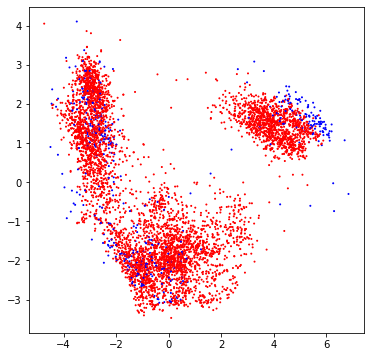

In [8]:
y = np.array([mrk.photo_reqs.too_dark_light.value for mrk in mrks])
print(y.shape)
print(np.unique(y, return_counts=True))

plot_pca(emb_2d, y)

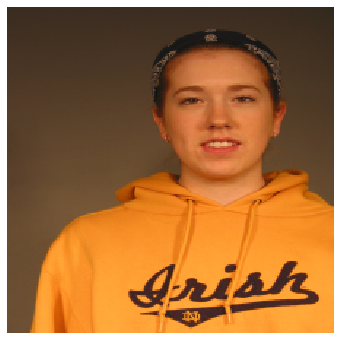

In [9]:
img_ref = get_reference_image(x, y)

[1.46028952 1.66152294 1.78845778 1.82078123 1.83183698 1.93279383
 2.00457092 2.0224265  2.04748265 2.05399683 2.10480806 2.15263878
 2.17906417 2.19260401 2.21856596 2.25177834 2.25293804 2.27312594
 2.31060227 2.31560325]


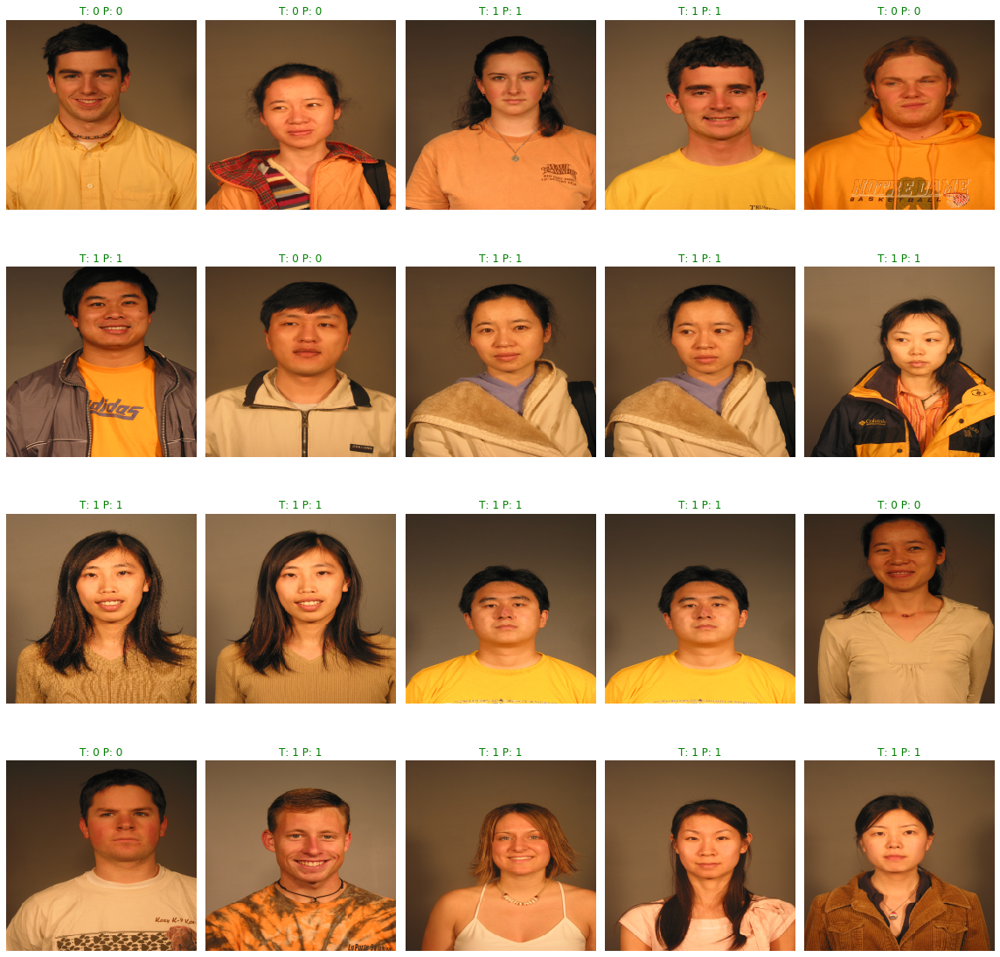

In [10]:
plot_closest_images(img_ref, encoder, x, y, embeddings)

### Veil Over Face

(5763,)
(array([0, 1]), array([ 364, 5399], dtype=int64))


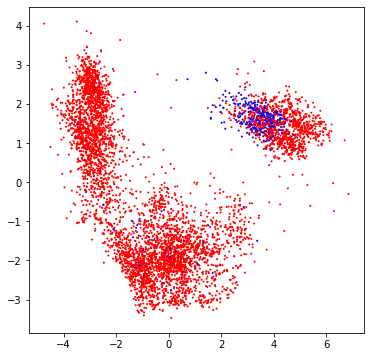

In [11]:
y = np.array([mrk.photo_reqs.veil_over_face.value for mrk in mrks])
print(y.shape)
print(np.unique(y, return_counts=True))

plot_pca(emb_2d, y)

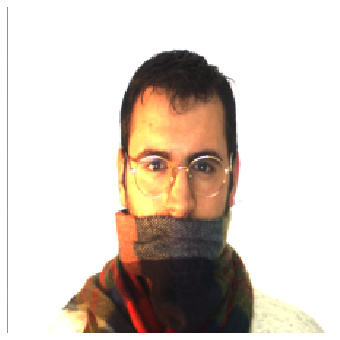

In [12]:
img_ref = get_reference_image(x, y)

[0.64324632 0.6508167  0.68285851 0.69488304 0.72446842 0.72473736
 0.72703303 0.73118921 0.74372824 0.74959297 0.75727129 0.76294356
 0.76719085 0.79425112 0.80049511 0.80877935 0.81412207 0.81653136
 0.82465623 0.82970535]


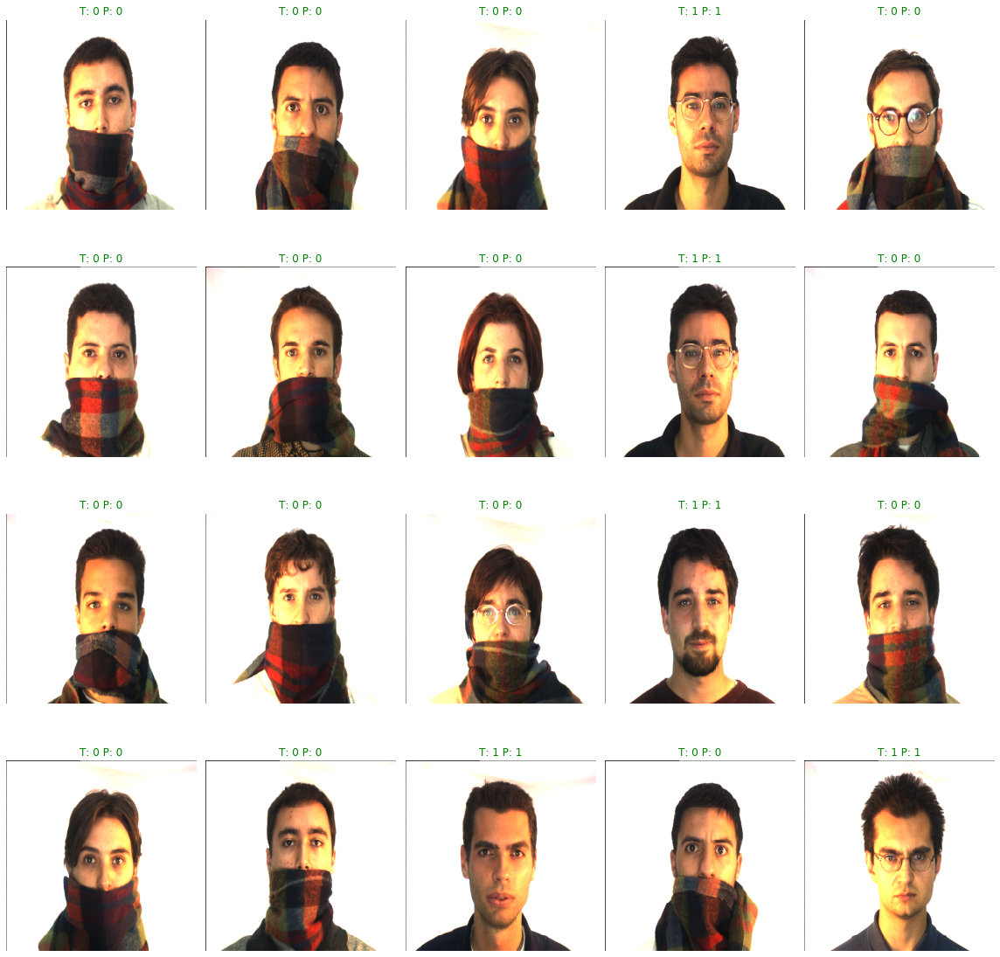

In [13]:
plot_closest_images(img_ref, encoder, x, y, embeddings, n_imgs=20, figsize=(16, 20))

### Washed Out

(5763,)
(array([0, 1]), array([  73, 5690], dtype=int64))


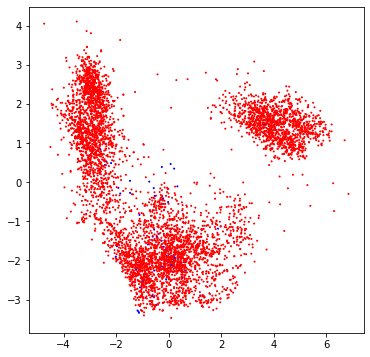

In [14]:
y = np.array([mrk.photo_reqs.washed_out.value for mrk in mrks])
print(y.shape)
print(np.unique(y, return_counts=True))

plot_pca(emb_2d, y)

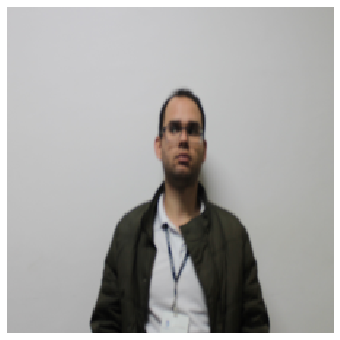

In [17]:
img_ref = get_reference_image(x, y)

[0.28125958 0.6061483  0.6267275  0.63721468 0.65229994 0.66035609
 0.66342587 0.66978603 0.67197408 0.67946731 0.68175696 0.68262477
 0.68317569 0.68856176 0.70675392 0.71143457 0.7146842  0.71589255
 0.72744885 0.72848917]


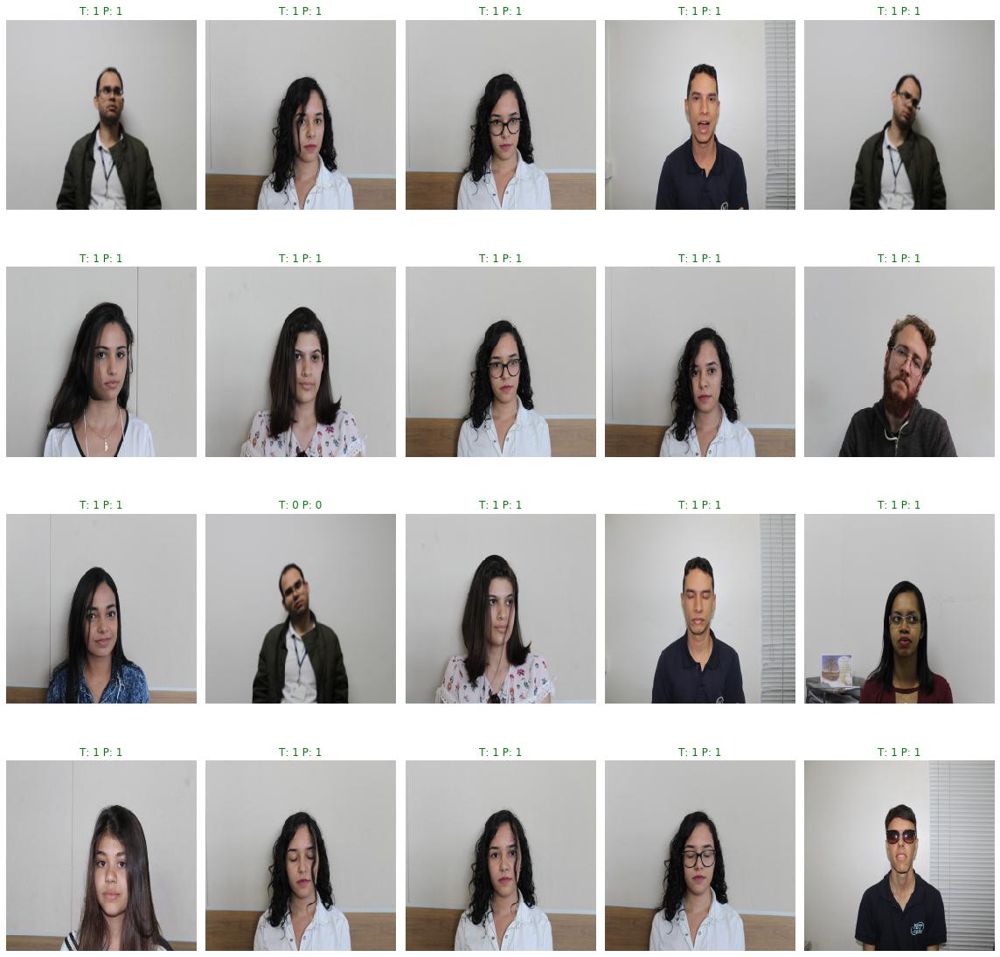

In [18]:
plot_closest_images(img_ref, encoder, x, y, embeddings, n_imgs=20, figsize=(16, 20))

### Blurred

(5763,)
(array([0, 1]), array([ 905, 4858], dtype=int64))


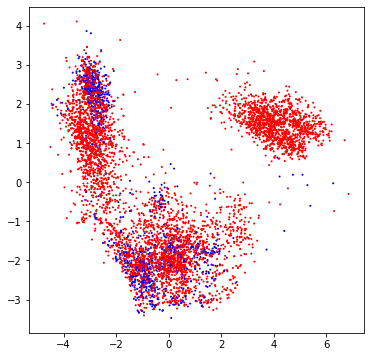

In [20]:
y = np.array([mrk.photo_reqs.blurred.value for mrk in mrks])
print(y.shape)
print(np.unique(y, return_counts=True))

plot_pca(emb_2d, y)

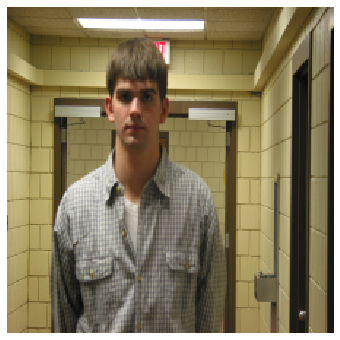

In [21]:
img_ref = get_reference_image(x, y)

[0.0623462  1.05119499 1.09018373 1.27404872 1.33470803 1.36360639
 1.40699019 1.40965876 1.41376219 1.41388281 1.41450312 1.42425454
 1.43935463 1.43981426 1.4403646  1.44508437 1.44607587 1.44809079
 1.45717278 1.47482505]


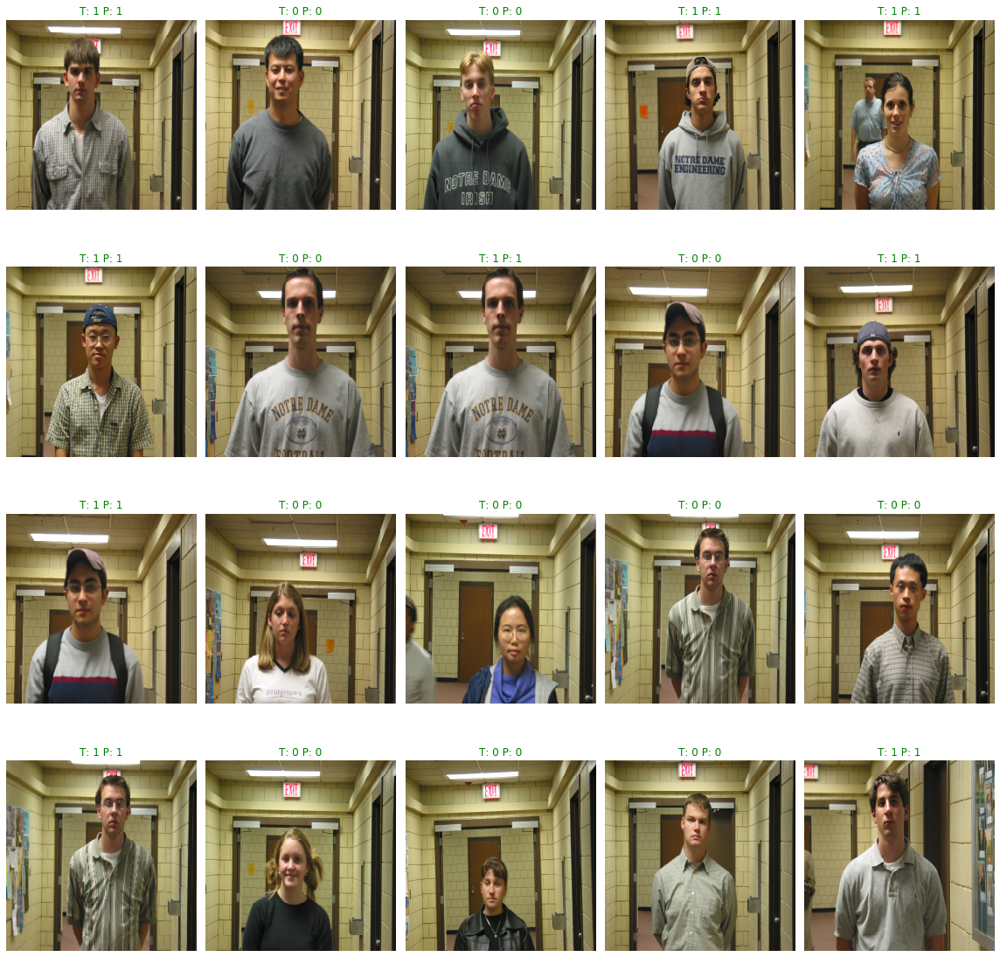

In [22]:
plot_closest_images(img_ref, encoder, x, y, embeddings, n_imgs=20, figsize=(16, 20))

# Worst Results 

### Eyes closed

(5763,)
(array([0, 1]), array([1323, 4440], dtype=int64))


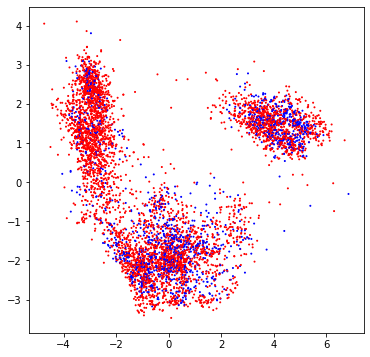

In [36]:
y = np.array([mrk.photo_reqs.eyes_closed.value for mrk in mrks])
print(y.shape)
print(np.unique(y, return_counts=True))

plot_pca(emb_2d, y)

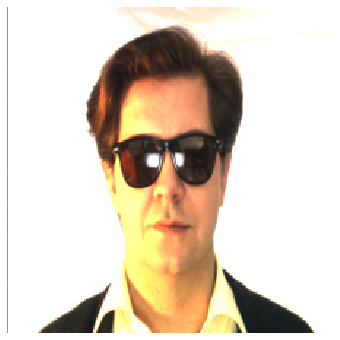

In [37]:
img_ref = get_reference_image(x, y)

[0.52638946 0.5315028  0.72292321 0.81664262 0.81822468 0.82385846
 0.82446088 0.84852637 0.89238592 0.91342288 0.91812762 0.92196131
 0.92833077 0.93093654 0.95185307 0.95373188 0.97374426 0.98076237
 0.98542207 0.99008165]


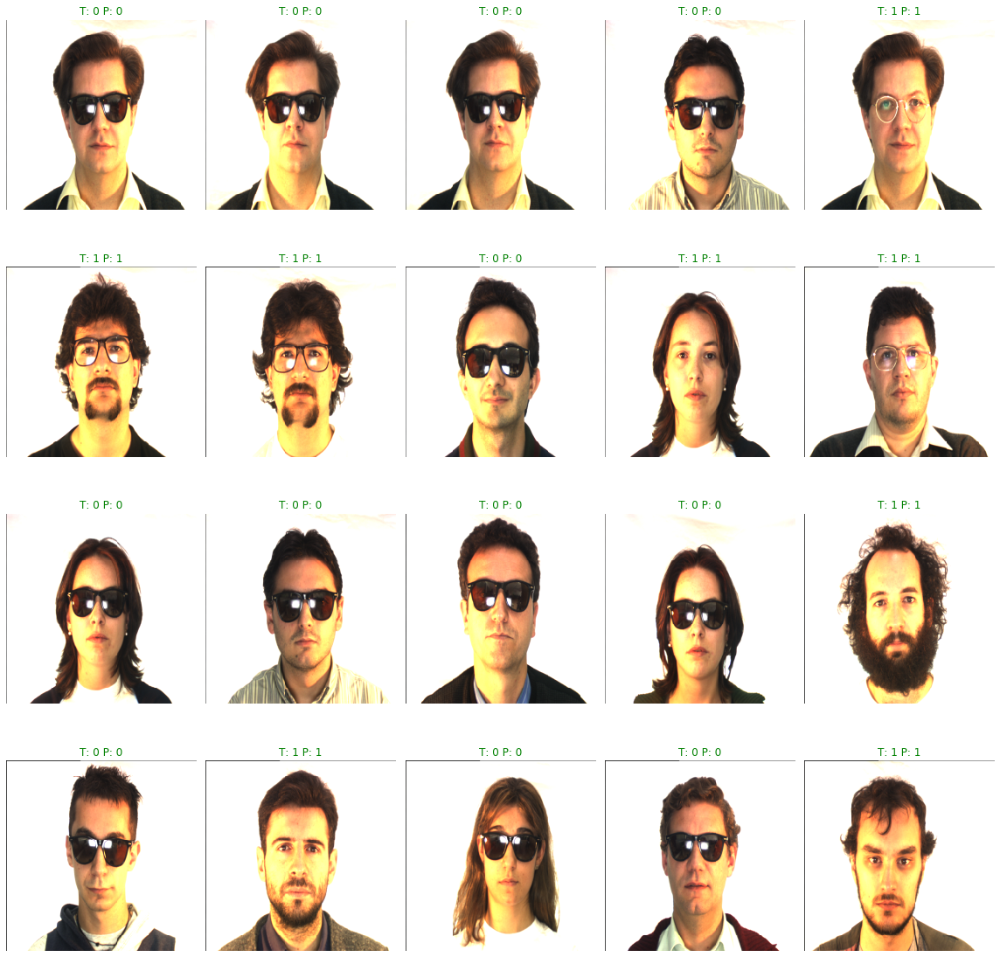

In [38]:
plot_closest_images(img_ref, encoder, x, y, embeddings, n_imgs=20, figsize=(16, 20))

### Frames Too Heavy

(5763,)
(array([0, 1]), array([  17, 5746], dtype=int64))


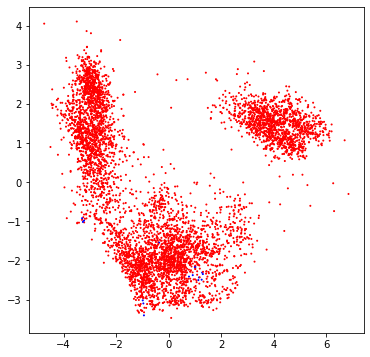

In [39]:
y = np.array([mrk.photo_reqs.frames_too_heavy.value for mrk in mrks])
print(y.shape)
print(np.unique(y, return_counts=True))

plot_pca(emb_2d, y)

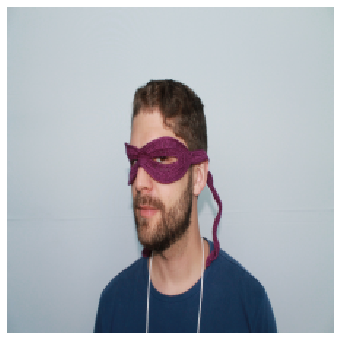

In [40]:
img_ref = get_reference_image(x, y)

[0.44373002 0.62297462 0.67698788 0.70919239 0.73074853 0.7374162
 0.75134118 0.86367352 0.87500528 1.00577786 1.05140664 1.0720154
 1.08016781 1.08228464 1.08482088 1.09093125 1.09144081 1.09281518
 1.09321344 1.10531904]


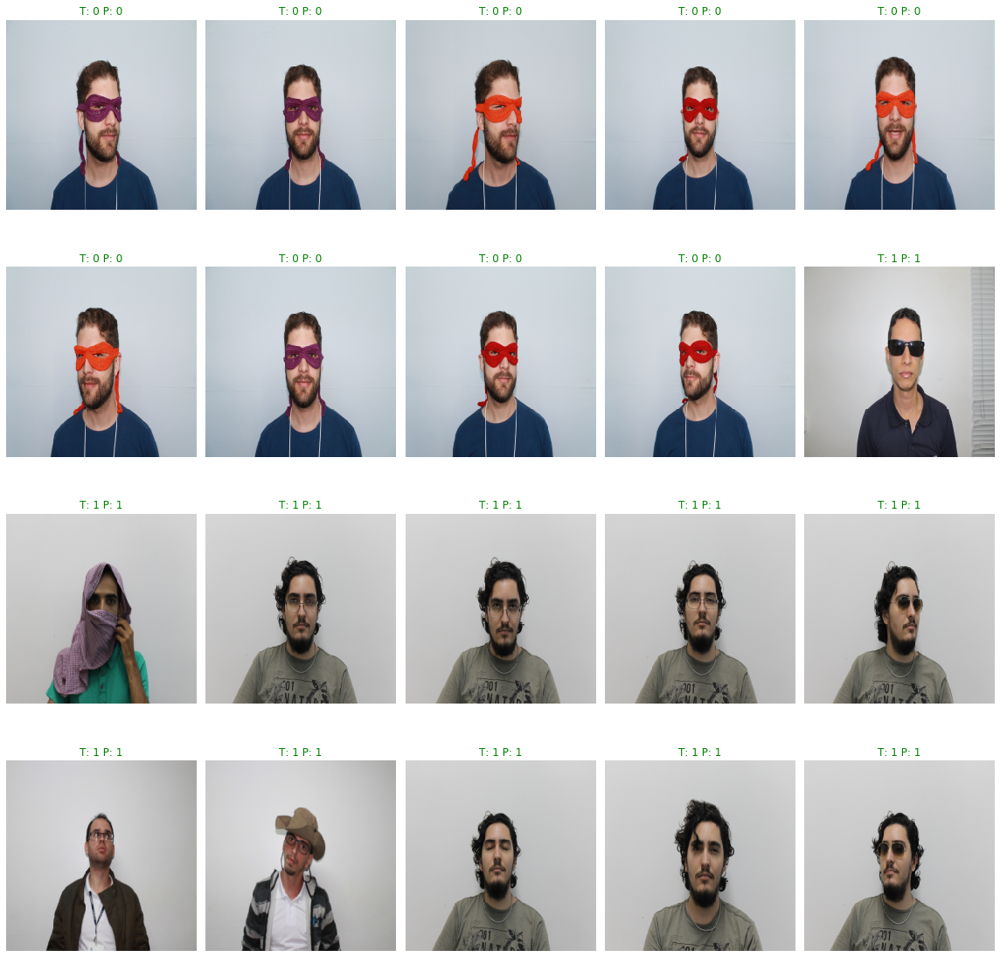

In [41]:
plot_closest_images(img_ref, encoder, x, y, embeddings, n_imgs=20, figsize=(16, 20))

# Others 

(5763,)
(array([0, 1]), array([ 849, 4914], dtype=int64))


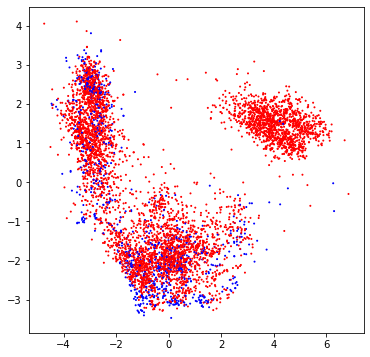

In [23]:
y = np.array([mrk.photo_reqs.hat_cap.value for mrk in mrks])
print(y.shape)
print(np.unique(y, return_counts=True))

plot_pca(emb_2d, y)

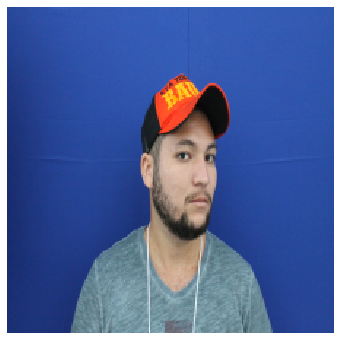

In [28]:
img_ref = get_reference_image(x, y)

[0.39240599 0.52948284 0.55900368 0.61507728 0.65418652 0.71513883
 0.72045703 0.79356406 0.95341678 0.99463689 1.00187448 1.00765628
 1.03308353 1.041126   1.05078953 1.05528493 1.07389922 1.07605894
 1.08785623 1.09058748]


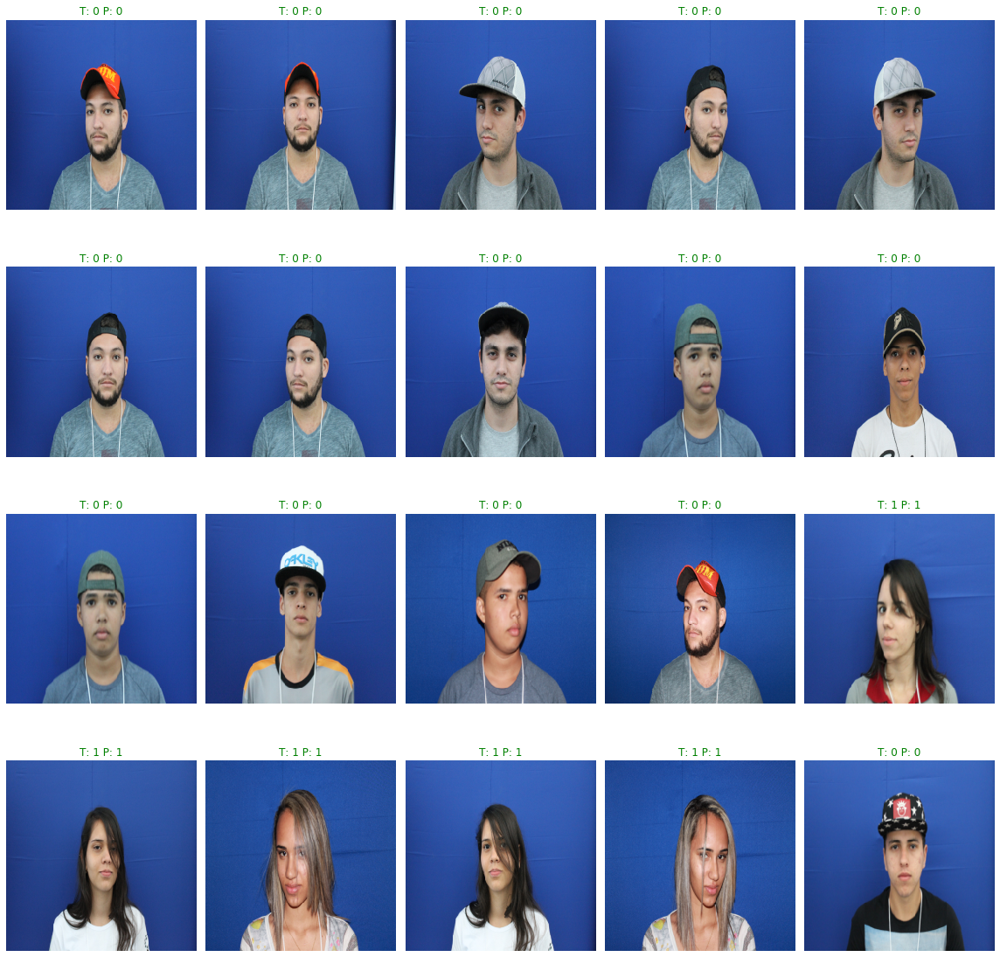

In [29]:
plot_closest_images(img_ref, encoder, x, y, embeddings, n_imgs=20, figsize=(16, 20))

# Roll/Pitch/Yaw 

(5763,)
(array([0, 1]), array([1416, 4347], dtype=int64))


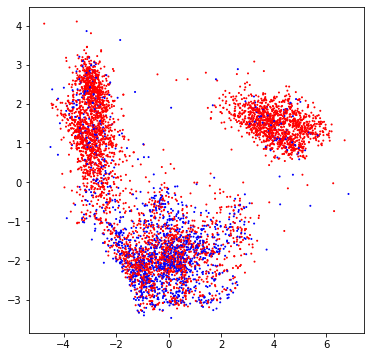

In [30]:
y = np.array([mrk.photo_reqs.roll_pitch_yaw.value for mrk in mrks])
print(y.shape)
print(np.unique(y, return_counts=True))

plot_pca(emb_2d, y)

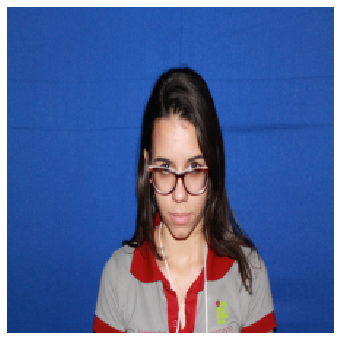

In [34]:
img_ref = get_reference_image(x, y)

[0.43558902 0.73673722 0.74451354 0.83820036 0.84505347 0.87569244
 0.89399623 0.91834149 0.9190288  0.93156669 0.94317342 0.95413327
 0.96562373 0.9836148  1.0065252  1.01293441 1.01362911 1.0211694
 1.04634026 1.0476851 ]


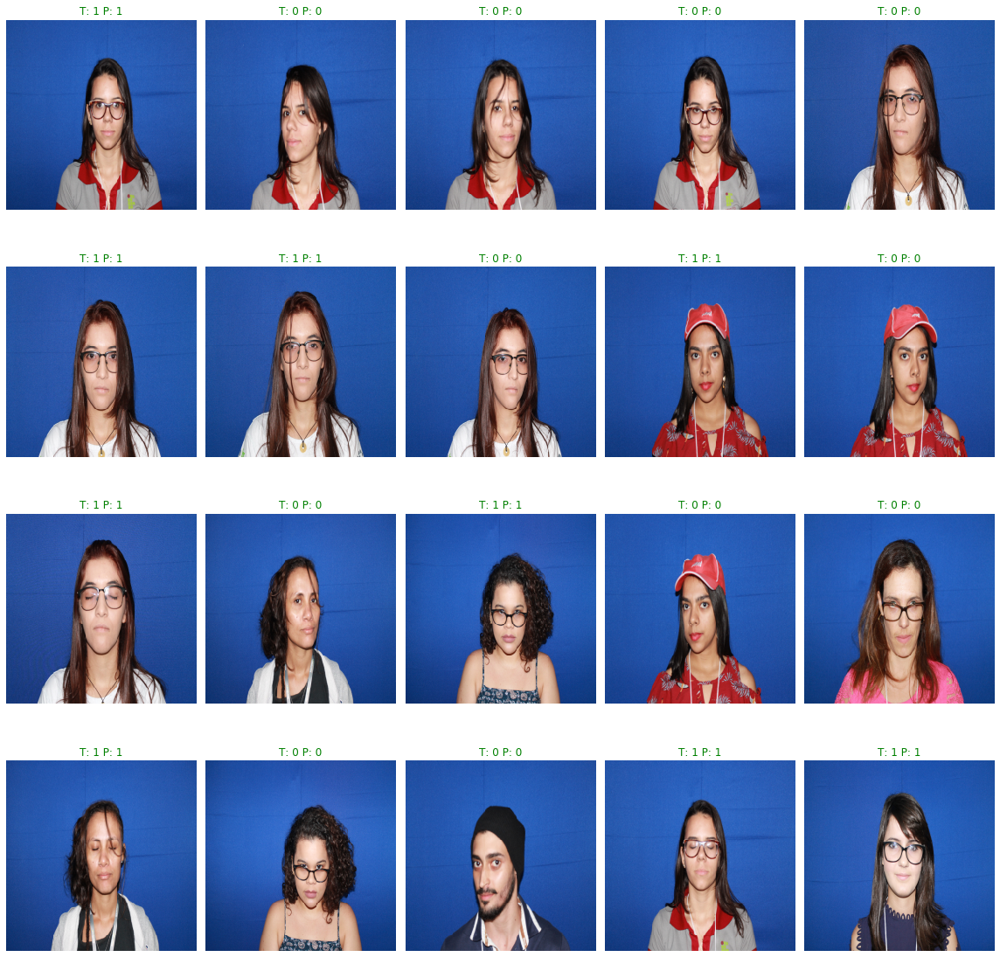

In [35]:
plot_closest_images(img_ref, encoder, x, y, embeddings, n_imgs=20, figsize=(16, 20))